In [1]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import geopandas as gpd


pd.options.display.max_columns = 999
pd.options.display.max_rows = 999
pd.options.display.max_colwidth = 100


import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
from matplotlib import rc


import plotly.express as px

from paths import *
from scripts import vis_simulaCovid

import yaml


## SimulaCovid API ('http://datasource.coronacidades.org:7000/')
- br/states/rt
- br/cities/embaixadores
- br/cities/cnes
- world/owid/heatmap
- br/cities/farolcovid/main
- br/cities/rt
- br/cities/simulacovid/main
- br/cities/cases/full
- br/states/farolcovid/main


### RT

In [2]:
#load br cities
geo_sp = gpd.read_file('../../brasil_geodata/maps/sp_municipios.json')
# cols = ['geocodigo','nome_mesorregiao','geometry']
cols = ['geocodigo','nome_mesorregiao','nome_municipio']
geo_sp = geo_sp[cols]

In [3]:
#load state data
url  = 'http://datasource.coronacidades.org/'
data = 'br/states/rt'

ds = pd.read_csv(f'{url}{data}')

ds['last_updated'] = pd.to_datetime(ds['last_updated'])

sp = ds[ds['state']=='SP']
sp = sp.rename(columns={'state':'city_id'})
sp['nome_mesorregiao'] = 'SP'
sp['nome_municipio']   = 'Estado de SP'

rj = ds[ds['state']=='RJ']
rj = rj.rename(columns={'state':'city_id'})
rj['nome_mesorregiao'] = 'RJ'
rj['nome_municipio']   = 'Estado do RJ'

mg = ds[ds['state']=='MG']
mg = mg.rename(columns={'state':'city_id'})
mg['nome_mesorregiao'] = 'MG'
mg['nome_municipio']   = 'Estado de MG'

am = ds[ds['state']=='AM']
am = am.rename(columns={'state':'city_id'})
am['nome_mesorregiao'] = 'AM'
am['nome_municipio']   = 'Estado de AM'

In [4]:
#load cities data
data = 'br/cities/rt'

df = pd.read_csv(f'{url}{data}')

df['last_updated'] = pd.to_datetime(df['last_updated'])


In [5]:

dd = df.merge(geo_sp, how='right', left_on = 'city_id', right_on = 'geocodigo')
dd.head()

regiao = 'Vale do Paraíba Paulista'
mask = (dd['nome_mesorregiao']==regiao)
vale = dd[mask]
vale = vale[vale['city_id'].notnull()]

mask = (dd['nome_municipio']=='São Paulo')
sp_city = dd[mask]


vale = pd.concat([vale,sp_city], 0)
vale = pd.concat([vale,sp], 0)
vale = pd.concat([vale,rj], 0)
vale = pd.concat([vale,mg], 0)
vale = pd.concat([vale,am], 0)

In [6]:
def plot_rt_final(df_final,col,N_COLS):
    
    N_ROWS = int(np.ceil(len(df_final[col].unique()) / N_COLS))

    # opening figura
    fig, axes = plt.subplots(nrows=N_ROWS, ncols=N_COLS, figsize=(15, N_ROWS*3), dpi=400)

    for i, (city, result) in enumerate(df_final.groupby(col,sort=False)):
        ax = axes.flat[i]
        vis_simulaCovid.plot_rt(result, ax, city)
    fig.tight_layout()
    fig.set_facecolor('w')
    
    return fig

In [7]:
len(vale['nome_municipio'].unique())

40

In [8]:
vale.sort_values(by='last_updated', ascending=False).head()

,city_id,last_updated,Rt_most_likely,Rt_low_95,Rt_high_95,data_last_refreshed,geocodigo,nome_mesorregiao,nome_municipio
330,AM,2020-07-24,0.86,0.80,0.89,2020-07-25 00:10:57,NaN,AM,Estado de AM
2910,SP,2020-07-24,1.08,1.05,1.10,2020-07-25 00:10:57,NaN,SP,Estado de SP
1214,MG,2020-07-24,1.07,1.02,1.10,2020-07-25 00:10:57,NaN,MG,Estado de MG
2116,RJ,2020-07-24,1.20,1.15,1.22,2020-07-25 00:10:57,NaN,RJ,Estado do RJ
7952,3.5105e+06,2020-07-23,1.15,1.01,1.26,2020-07-24 19:34:52,3510500.0,Vale do Paraíba Paulista,Caraguatatuba


In [9]:
fig = plot_rt_final(ds,'state',3)
fig.savefig("/home/m/Downloads/Evolucao da Taxa de Transmissão Efetiva - Estados.pdf.pdf", bbox_inches='tight')

In [10]:
last_date = max(vale['last_updated']).strftime('%d-%m-%Y')

fig = plot_rt_final(vale,'nome_municipio',4)

fig.savefig(f"/home/m/Downloads/Evolucao da Taxa de Transmissão Efetiva - Vale do Paraíba e Litoral Norte.pdf", bbox_inches='tight')

## Selected cities

In [11]:
## Rt for most recent date
max_date = max(vale['last_updated'])
vale_last_date = vale.drop_duplicates('nome_municipio', keep='last').sort_values(by='Rt_most_likely')
last_date = max_date.strftime('%Y-%m-%d')
fig = vis_simulaCovid.plot_rt_bars(vale_last_date, title= f'Taxa Transmissão Efetiva em {last_date}', place_type='nome_municipio')

In [12]:
fig = fig.update_xaxes(tickangle=30)
fig.write_image(f"/home/m/Downloads/Taxa Transmissão Efetiva em {last_date}.pdf", width=1080, height=720)

In [13]:
fig

In [14]:
vale_last_date['nome_municipio']

330                 Estado de AM
35447                  São Paulo
35708              São Sebastião
1214                Estado de MG
2910                Estado de SP
18260                    Jacareí
34971        São José dos Campos
32222               Santa Branca
14879                    Igaratá
7362            Campos do Jordão
19765                  Lavrinhas
9880                    Cruzeiro
7952               Caraguatatuba
18615                   Jambeiro
27269            Pindamonhangaba
33633    Santo Antônio do Pinhal
25715                  Paraibuna
31275                    Roseira
2116                Estado do RJ
38536                   Tremembé
20321                     Lorena
27503                    Piquete
29963                     Queluz
6250                    Caçapava
38984                    Ubatuba
35112     São Luiz do Paraitinga
38144                    Taubaté
15074                   Ilhabela
1759                   Aparecida
23736        Natividade da Serra
13589     

In [15]:
municipios = ['São Paulo', 'Estado de SP', 'Taubaté', 'São José dos Campos', 'Jambeiro','Roseira','Ubatuba']
vale_filtered = vale[vale['nome_municipio'].isin(municipios)]



themes = yaml.load(open('../themes/themes_simulaCovid.yaml', 'r'), Loader=yaml.FullLoader)
themes = themes['rt_selected_cities']
fig = vis_simulaCovid.plot_rt_plotly(vale_filtered, themes)

fig

## BR

In [16]:
br = pd.read_csv('../../brasil_geodata/maps/br_municipios_ibge.csv')
br = br[['geocodigo','nome_municipio','nome_uf']]

br_rt_full = df.copy()
br_rt_full = br.merge(br_rt_full, how='right', left_on = 'geocodigo', right_on = 'city_id')




br_rt = br_rt_full.sort_values(by='last_updated', ascending=False).groupby(by='city_id', as_index=False).first().sort_values(by='Rt_most_likely', ascending=True)




In [17]:
br_rt.head(3)

,city_id,geocodigo,nome_municipio,nome_uf,last_updated,Rt_most_likely,Rt_low_95,Rt_high_95,data_last_refreshed
4628,5103403,5103403,Cuiabá,Mato Grosso,2020-07-23,0.60,0.52,0.66,2020-07-24 19:34:52
258,1506807,1506807,Santarém,Pará,2020-07-23,0.61,0.51,0.69,2020-07-24 19:34:52
210,1504208,1504208,Marabá,Pará,2020-07-23,0.65,0.55,0.73,2020-07-24 19:34:52


In [18]:
municipios = br_rt.head(3)['nome_municipio'].tolist() + ['São Paulo', 'Estado de SP', 'Taubaté', 'São José dos Campos', 'Assis']

In [19]:
br_rt_filtered = br_rt_full[br_rt_full['nome_municipio'].isin(municipios)].sort_values(by='last_updated')



themes = yaml.load(open('../themes/themes_simulaCovid.yaml', 'r'), Loader=yaml.FullLoader)
themes = themes['rt_selected_cities']
fig = vis_simulaCovid.plot_rt_plotly(br_rt_filtered, themes)

fig

## RT MAP

In [ ]:
#load br cities
sp = gpd.read_file('../../brasil_geodata/maps/sp_municipios.json')
cols = ['geocodigo','nome_mesorregiao','geometry']
sp = sp[cols]

In [ ]:
#load data
url  = 'http://datasource.coronacidades.org:7000/'
data = 'br/cities/farolcovid/main'

df = pd.read_csv(f'{url}{data}')

dd = df.merge(sp, how='right', left_on = 'city_id', right_on = 'geocodigo')
dd = gpd.GeoDataFrame(dd)


regiao = 'Vale do Paraíba Paulista'
mask = dd['nome_mesorregiao']==regiao
vale = dd[mask]

vale = gpd.GeoDataFrame(vale)

In [116]:
def plot_map(dd,var):
    fig = plt.figure(figsize=(25,25))
    ax  = fig.add_subplot(1,1,1)
    ax.set_title(f'{var}', fontsize=23)


    missings={
        "color": "white",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Missing values",
    }


    # dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[0.75,1]},missing_kwds=missings )
#     dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[10,100,500,1000,10000]},missing_kwds=missings )
#     dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[1,5,10,50,100,500,1000,3000]},missing_kwds=missings )
    dd.plot(column=var,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff",  scheme='user_defined', classification_kwds={'bins':[10,30,50,70]},missing_kwds=missings )

#     dd.plot(column=var ,ax=ax, legend=True,cmap='Oranges', edgecolor = "#ffffff" ,missing_kwds=missings, scheme='quantiles',k=30)

    ax.axis('off')


    plt.rc('legend',fontsize='large')

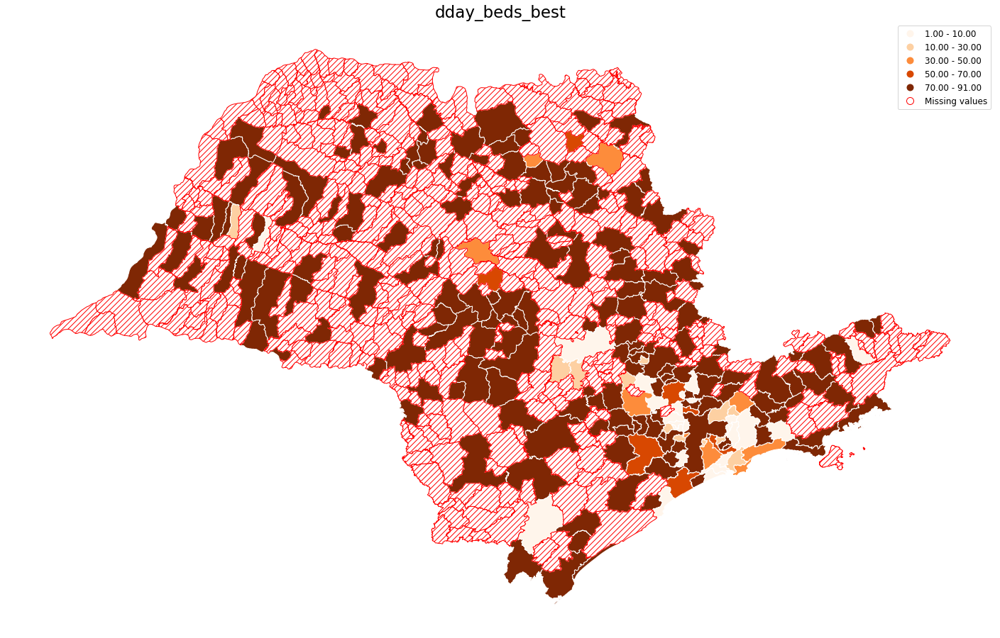

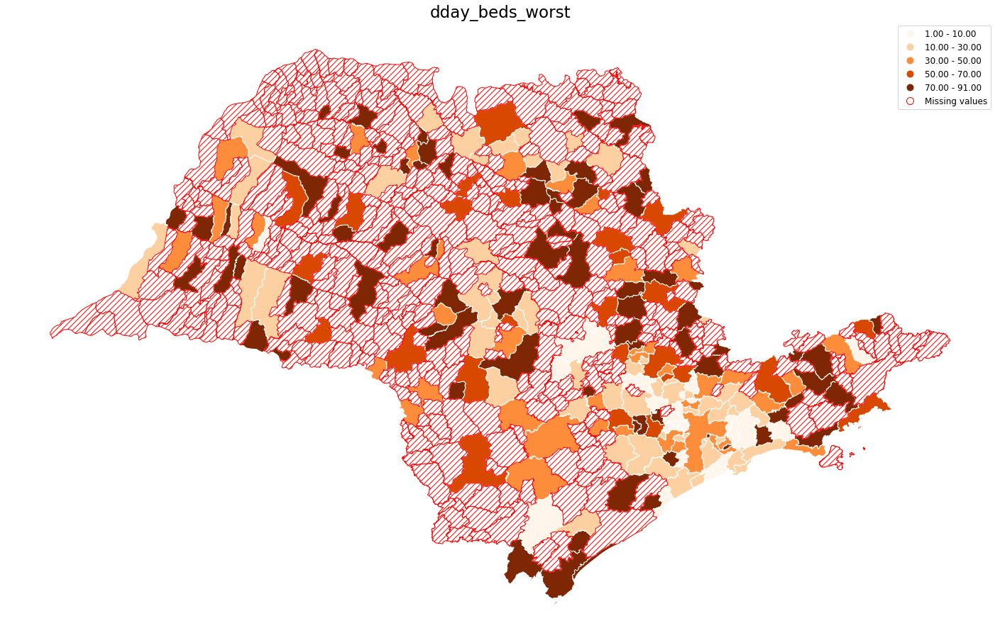

In [117]:
var = 'dday_beds_best'

plot_map(dd,var)


var = 'dday_beds_worst'

plot_map(dd,var)



# var = 'rt_10days_ago_avg'

# plot_map(dd,var)

# var = 'rt_ratio_week_avg'

# plot_map(dd,var)